In [63]:
import numpy as np
import pandas as pd
import emukit
import GPy
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns

In [64]:

df_film = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241002Film')


df_film.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Notes']


df_film_20241002 = df_film

df_film = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241015Film')
df_film.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Notes']
df_film_20241015 = df_film

df_film = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241018Film')
df_film.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Notes']
df_film_20241018 = df_film

df_film = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241030Film')
df_film.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Notes']
df_film_20241030 = df_film

df_film = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241104Film')
df_film.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Notes']
df_film_20241104 = df_film


df_film = pd.concat([df_film_20241002, df_film_20241015,df_film_20241018,df_film_20241030,df_film_20241104], ignore_index = True)
df_film.iloc[:,:-1]


df_film['Notes'] = df_film['Notes'].replace({'A': 1, 'B': 0, 'C': 0})


df_film


,Experiment Condition,E-81 amount [g],Vacuum distillation time [min],Curing agent amount [%],Thickness [um],Curing power1 [%],Curing power2 [%],Distance [cm],Time1 [s],Time2 [s],Notes
0,1,30,180,2.0,400,20,80,12,4,6,1
1,2,30,300,4.5,400,10,80,18,1,9,1
2,3,10,60,4.5,400,50,60,18,1,9,1
3,4,10,300,4.5,400,10,80,18,1,9,1
4,5,40,240,3.0,400,20,90,6,2,8,1
5,6,50,300,4.0,600,10,100,6,2,8,0
6,7,10,60,4.5,400,10,100,12,2,8,1
7,8,30,180,2.0,600,20,90,18,2,8,1
8,9,40,240,3.0,400,40,70,12,3,7,1
9,10,50,300,4.0,600,10,80,6,2,8,1


In [65]:
df_PreData = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='PreData')
print(df_PreData.columns)
df_PreData.columns = ['Experiment Condition', 'E-81 amount [g]','Vacuum distillation time [min]',
                    'Curing agent amount [%]', 'Thickness [um]', 'Curing power1 [%]', 
                     'Curing power2 [%]', 'Distance [cm]', 'Time1 [s]', 'Time2 [s]', 
                      'Transmittance [%]']
df_PreData

Index(['Experiment Condition', 'E-81 amount/g', 'Vacuum distillation time/min',
       'Curing agent amount/%', 'Thickness/um', 'Curing power1/%',
       'Curing power2/%', 'Distance/cm', 'Time1/s', 'Time2/s',
       'Transmittance/%'],
      dtype='object')


,Experiment Condition,E-81 amount [g],Vacuum distillation time [min],Curing agent amount [%],Thickness [um],Curing power1 [%],Curing power2 [%],Distance [cm],Time1 [s],Time2 [s],Transmittance [%]
0,1,10,5,3.0,400,10,100,6,1,9,0.00
1,2,10,15,3.0,400,10,100,12,1,9,0.00
2,3,10,25,3.0,400,10,100,12,1,9,33.76
3,4,10,60,3.0,400,10,90,24,2,8,85.40
4,5,10,120,3.0,450,20,85,12,2,8,82.88
5,6,10,180,3.0,450,20,85,18,2,8,83.67
6,7,10,240,3.0,450,15,85,12,2,8,84.08
7,8,20,10,4.5,500,20,90,18,2,8,0.00
8,9,20,20,4.5,500,20,90,18,2,8,0.00
9,10,20,30,4.5,500,20,90,18,2,8,20.75


In [66]:

df_device = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241002Device')


df_device.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Transmittance [%]']

df_device_20241002 = df_device

df_device = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241015Device')
df_device.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Transmittance [%]']
df_device_20241015 = df_device

df_device = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241018Device')
df_device.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Transmittance [%]']
df_device_20241018 = df_device

df_device = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241030Device')
df_device.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Transmittance [%]']
df_device_20241030 = df_device

df_device = pd.read_excel('D:/works/paper1/my_works/Experimental Data.xlsx', sheet_name='20241104Device')
df_device.columns = ['Experiment Condition', 'E-81 amount [g]', 'Vacuum distillation time [min]', 'Curing agent amount [%]', 
                   'Thickness [um]', 'Curing power1 [%]', 'Curing power2 [%]', 'Distance [cm]', 
                   'Time1 [s]', 'Time2 [s]', 'Transmittance [%]']
df_device_20241104 = df_device



df_device = pd.concat([df_device_20241002, df_device_20241015,df_device_20241018,df_device_20241030,df_device_20241104], ignore_index = True)

df_device = df_device[df_device['Transmittance [%]'].notna()]
# 查看合并后的 DataFrame
df_device

,Experiment Condition,E-81 amount [g],Vacuum distillation time [min],Curing agent amount [%],Thickness [um],Curing power1 [%],Curing power2 [%],Distance [cm],Time1 [s],Time2 [s],Transmittance [%]
0,1,30,180,2.0,400,20,80,12,4,6,58.020000
1,2,30,300,4.5,400,10,80,18,1,9,82.940000
2,3,10,60,4.5,400,50,60,18,1,9,71.910000
3,4,10,300,4.5,400,10,80,18,1,9,84.570000
4,5,40,240,3.0,400,20,90,6,2,8,82.010000
6,7,10,60,4.5,400,10,100,12,2,8,77.390000
7,8,30,180,2.0,600,20,90,18,2,8,75.330000
8,9,40,240,3.0,400,40,70,12,3,7,82.850000
9,10,50,300,4.0,600,10,80,6,2,8,63.120000
10,11,10,60,4.5,800,10,80,18,1,9,81.360000


In [67]:
GQDs_min, GQDs_max, GQDs_step = [2, 16, 4] 
GQDs_var = np.arange(GQDs_min, GQDs_max+GQDs_step, GQDs_step)
GQDs_num = len(GQDs_var)

Vtime_min, Vtime_max, Vtime_step = [120, 240, 30] 
Vtime_var = np.arange(Vtime_min, Vtime_max+Vtime_step, Vtime_step)
Vtime_num = len(Vtime_var)

Camount_min, Camount_max, Camount_step = [1, 5, 0.5] 
Camount_var = np.arange(Camount_min, Camount_max+Camount_step, Camount_step)
Camount_num = len(Camount_var)

Thickness_min, Thickness_max, Thickness_step = [100, 1000, 50] 
Thickness_var = np.arange(Thickness_min, Thickness_max+Thickness_step, Thickness_step)
Thickness_num = len(Thickness_var)

Cpower1_min, Cpower1_max, Cpower1_step = [10, 50, 5] 
Cpower1_var = np.arange(Cpower1_min, Cpower1_max+Cpower1_step, Cpower1_step)
Cpower1_num = len(Cpower1_var)

Cpower2_min, Cpower2_max, Cpower2_step = [50, 100, 5] 
Cpower2_var = np.arange(Cpower2_min, Cpower2_max+Cpower2_step, Cpower2_step)
Cpower2_num = len(Cpower2_var)

Distance_min, Distance_max, Distance_step = [6, 24, 6] 
Distance_var = np.arange(Distance_min, Distance_max+Distance_step, Distance_step)
Distance_num = len(Distance_var)

Time1_min, Time1_max, Time1_step = [1, 5, 1] 
Time1_var = np.arange(Time1_min, Time1_max+Time1_step, Time1_step)
Time1_num = len(Time1_var)

Time2_min, Time2_max, Time2_step = [6, 10, 1] 
Time2_var = np.arange(Time2_min, Time2_max+Time2_step, Time2_step)
Time2_num = len(Time2_var)


var_array = [GQDs_var,  Vtime_var,Camount_var, Thickness_var,
             Cpower1_var,Cpower2_var,Distance_var,Time1_var,Time2_var]
x_labels = ['GQDs-30 amount [g]', 'Vacuum distillation time [min]','Curing agent amount [%]', 'Thickness [um]', 'Curing power1 [%]', 
                     'Curing power2 [%]', 'Distance [cm]', 'Time1 [s]', 'Time2 [s]']
def x_normalizer(X):
    
    def max_min_scaler(x, x_max, x_min):
        return (x-x_min)/(x_max-x_min)
    
    x_norm = []
    for x in (X):
           x_norm.append([max_min_scaler(x[i], 
                                         max(var_array[i]), 
                                         min(var_array[i])) for i in range(len(x))])  
    return np.array(x_norm)

def x_denormalizer(x_norm):
    def max_min_rescaler(x, x_max, x_min):
        return x*(x_max-x_min)+x_min
    
    x_original = []
    for x in (x_norm):
           x_original.append([max_min_rescaler(x[i], 
                                         max(var_array[i]), 
                                         min(var_array[i])) for i in range(len(x))])
    return np.array(x_original)



def get_closest_array(suggested_x):
    
    def get_closest_value(given_value, array_list):
        absolute_difference_function = lambda list_value : abs(list_value - given_value)
        closest_value = min(array_list, key=absolute_difference_function)
        return closest_value
    
    var_list = var_array
    modified_array = []
    for x in suggested_x:
        modified_array.append([get_closest_value(x[i], var_list[i]) for i in range(len(x))])
    return np.array(modified_array)

In [68]:
from emukit.core import ParameterSpace, ContinuousParameter, DiscreteParameter
from emukit.core.initial_designs.random_design import RandomDesign
from emukit.core.initial_designs.latin_design import LatinDesign

parameter_space = ParameterSpace([ContinuousParameter('GQDs', 0-1/(GQDs_num-1)/2, 1+1/(GQDs_num-1)/2),
                                 ContinuousParameter('Vtime', 0-1/(Vtime_num-1)/2, 1+1/(Vtime_num-1)/2),
                                  ContinuousParameter('Camount', 0-1/(Camount_num-1)/2, 1+1/(Camount_num-1)/2),
                                 ContinuousParameter('Thickness', 0-1/(Thickness_num-1)/2, 1+1/(Thickness_num-1)/2),
                                 ContinuousParameter('Cpower1', 0-1/(Cpower1_num-1)/2, 1+1/(Cpower1_num-1)/2),
                                 ContinuousParameter('Cpower2', 0-1/(Cpower2_num-1)/2, 1+1/(Cpower2_num-1)/2),
                                 ContinuousParameter('Distance', 0-1/(Distance_num-1)/2, 1+1/(Distance_num-1)/2),
                                 ContinuousParameter('Time1', 0-1/(Time1_num-1)/2, 1+1/(Time1_num-1)/2),
                                 ContinuousParameter('Time2', 0-1/(Time2_num-1)/2, 1+1/(Time2_num-1)/2)])

In [69]:
from typing import Union
from emukit.core.acquisition import Acquisition
from emukit.core.interfaces import IModel, IDifferentiable
from emukit.core.loop import FixedIntervalUpdater, OuterLoop, SequentialPointCalculator
from emukit.core.loop.loop_state import create_loop_state
from emukit.core.optimization import AcquisitionOptimizerBase
from emukit.core.optimization import GradientAcquisitionOptimizer
from emukit.bayesian_optimization.acquisitions.log_acquisition import LogAcquisition
from emukit.bayesian_optimization.local_penalization_calculator import LocalPenalizationPointCalculator
from emukit.bayesian_optimization.acquisitions import ExpectedImprovement, \
                                                      NegativeLowerConfidenceBound, \
                                                      MaxValueEntropySearch, \
                                                      MultipointExpectedImprovement,\
                                                      ProbabilityOfFeasibility
from emukit.core.acquisition import IntegratedHyperParameterAcquisition

class ProbabilisticConstraintBayesianOptimizationLoop2(OuterLoop):
    def __init__(self, space: ParameterSpace, model_objective: Union[IModel, IDifferentiable],
                 model_constraint1: Union[IModel, IDifferentiable], 
                 model_constraint2: Union[IModel, IDifferentiable],
                 acquisition: Acquisition = None,
                 update_interval: int = 1, batch_size: int = 1):

        """
        Emukit class that implements a loop for building Bayesian optimization with an unknown constraint.
        For more information see:
        Michael A. Gelbart, Jasper Snoek, and Ryan P. Adams,
        Bayesian Optimization with Unknown Constraints,
        https://arxiv.org/pdf/1403.5607.pdf
        :param space: Input space where the optimization is carried out.
        :param model_objective: The model that approximates the underlying objective function
        :param model_constraint: The model that approximates the unknown constraints
        :param acquisition: The acquisition function for the objective function (default, EI).
        :param update_interval:  Number of iterations between optimization of model hyper-parameters. Defaults to 1.
        :param batch_size: How many points to evaluate in one iteration of the optimization loop. Defaults to 1.
        """

#         if not np.all(np.isclose(model_objective.X, model_constraint.X)):
#             raise ValueError('Emukit currently only supports identical '
#                              'training inputs for the constrained and objective model')
        self.model_objective = model_objective
        self.model_constraint1 = model_constraint1
        self.model_constraint2 = model_constraint2
        
        if acquisition is None:
            acquisition = ExpectedImprovement(model_objective)
        
        acquisition_constraint1 = ScaledProbabilityOfFeasibility(model_constraint1, max_value = 1, min_value = 0.5)
        acquisition_constraint2 = ScaledProbabilityOfFeasibility(model_constraint2, max_value = 1, min_value = 0.8)
        acquisition_constraint = acquisition_constraint1*acquisition_constraint2
        acquisition_constrained = acquisition * acquisition_constraint

        model_updater_objective = FixedIntervalUpdater(model_objective, update_interval)
        model_updater_constraint1 = FixedIntervalUpdater(model_constraint1, update_interval,
                                                        lambda state: state.Y_constraint1)
        model_updater_constraint2 = FixedIntervalUpdater(model_constraint2, update_interval,
                                                        lambda state: state.Y_constraint2)

        acquisition_optimizer = GradientAcquisitionOptimizer(space)
        if batch_size == 1:
            candidate_point_calculator = SequentialPointCalculator(acquisition_constrained, acquisition_optimizer)
        else:
            log_acquisition = LogAcquisition(acquisition_constrained)
            candidate_point_calculator = LocalPenalizationPointCalculator(log_acquisition, acquisition_optimizer,
                                                                          model_objective, space, batch_size)
        loop_state = create_loop_state(model_objective.X, model_objective.Y)
        
        #loop_state = create_loop_state(model_objective.X, model_objective.Y, Y_constraint=model_constraint.Y)

        super(ProbabilisticConstraintBayesianOptimizationLoop2, self).__init__(candidate_point_calculator,
                                                                              [model_updater_objective, model_updater_constraint1,model_updater_constraint2],
                                                                              loop_state)
#     def suggest_next_locations(self):
#         return self.candidate_point_calculator.compute_next_points(self.loop_state)
    
#     def acquisition_evaluate(self, X: loop_sate.X):
#         return acquisition.evaluate(X), acquisition_constraint.evaluate(X), acquisition_constrained.evaluate(X)


In [70]:
from typing import Tuple, Union
import scipy.stats
import numpy as np
from emukit.core.acquisition import Acquisition
from emukit.core.interfaces import IModel, IDifferentiable

class ScaledProbabilityOfFeasibility(Acquisition):

    def __init__(self, model: Union[IModel, IDifferentiable], jitter: float = float(0),
                 max_value: float = float(1), min_value: float = float(0)) -> None:
        """
        This acquisition computes for a given input point the probability of satisfying the constraint
        C<0. For more information see:
        Michael A. Gelbart, Jasper Snoek, and Ryan P. Adams,
        Bayesian Optimization with Unknown Constraints,
        https://arxiv.org/pdf/1403.5607.pdf
        :param model: The underlying model that provides the predictive mean and variance for the given test points
        :param jitter: Jitter to balance exploration / exploitation
        """
        self.model = model
        self.jitter = jitter
        self.max_value = max_value
        self.min_value = min_value

    def evaluate(self, x: np.ndarray) -> np.ndarray:
        """
        Computes the probability of of satisfying the constraint C<0.
        :param x: points where the acquisition is evaluated, shape (number of points, number of dimensions).
        :return: numpy array with the probability of satisfying the constraint at the points x.
        """
        mean, variance = self.model.predict(x)
        mean += self.jitter

        standard_deviation = np.sqrt(variance)
        cdf = scipy.stats.norm.cdf(0, mean, standard_deviation)
        return cdf*(self.max_value-self.min_value)+self.min_value

    def evaluate_with_gradients(self, x: np.ndarray) -> Tuple:
        """
        Computes the  probability of of satisfying the constraint C<0.
        :param x: points where the acquisition is evaluated, shape (number of points, number of dimensions).
        :return: tuple of numpy arrays with the probability of satisfying the constraint at the points x 
        and its gradient.
        """
        mean, variance = self.model.predict(x)
        standard_deviation = np.sqrt(variance)

        dmean_dx, dvariance_dx = self.model.get_prediction_gradients(x)
        dstandard_devidation_dx = dvariance_dx / (2 * standard_deviation)

        mean += self.jitter
        u = - mean / standard_deviation
        pdf = scipy.stats.norm.pdf(0, mean, standard_deviation)
        cdf = scipy.stats.norm.cdf(0, mean, standard_deviation)
        dcdf_dx = - pdf * (dmean_dx + dstandard_devidation_dx * u)

        return cdf*(self.max_value-self.min_value)+self.min_value, dcdf_dx

    @property
    def has_gradients(self):
        return isinstance(self.model, IDifferentiable)

In [71]:
np.random.seed(10)

from GPy.models import GPRegression
from emukit.model_wrappers import GPyModelWrapper

x_init = x_normalizer(df_device.iloc[:,1:10].values)
y_init = np.transpose([df_device.iloc[:,-1].values])
xc_init = x_normalizer(df_film.iloc[:,1:10].values)
yc_init = np.transpose([df_film.iloc[:,-1].values])
X, Y, Xc, Yc = [x_init, y_init, xc_init, yc_init]

Xc2 = x_normalizer(df_PreData.iloc[:,1:10].values)
Yc2 = np.transpose([df_PreData.iloc[:,-1].values])

input_dim = len(X[0])
ker = GPy.kern.Matern52(input_dim = input_dim, ARD =True)#
ker.lengthscale.constrain_bounded(1e-5, 1)
ker.variance.constrain_bounded(1e-5, 1000.0)
ker += GPy.kern.White(input_dim = input_dim)
model_gpy = GPRegression(X , -Y, ker)#Emukit is a minimization tool; need to make Y negative
model_gpy.Gaussian_noise.variance = 0.5**2
model_gpy.Gaussian_noise.variance.fix()
model_gpy.randomize()
model_gpy.optimize_restarts(num_restarts=20,verbose =False, messages=False)
objective_model = GPyModelWrapper(model_gpy)                                      

input_dim = len(Xc[0])
ker = GPy.kern.RBF(input_dim = input_dim, ARD = True)
ker.lengthscale.constrain_bounded(1e-1, 1)
ker.variance.constrain_bounded(1e-1, 1000.0) 
ker += GPy.kern.White(input_dim = input_dim)
yc_offset = 0.5 
gpy_constraint_model = GPRegression(Xc, -(Yc-yc_offset), ker) #Emukit is a minimization tool; need to make Y negative;
gpy_constraint_model.randomize()
gpy_constraint_model.optimize_restarts(num_restarts=20,verbose =False, messages=False) 
constraint_model1 = GPyModelWrapper(gpy_constraint_model)

input_dim = len(Xc2[0])
ker = GPy.kern.RBF(input_dim = input_dim, ARD =True)#
ker.lengthscale.constrain_bounded(0.5, 1)#avoid overfitting; use a large lower bound
ker.variance.constrain_bounded(1e-1, 1000.0)
ker += GPy.kern.White(input_dim = input_dim)
yc2_offset = np.mean(Yc2)  # constraint acquisition computes the probability of <0
gpy_constraint_model2 = GPRegression(Xc2 , -(Yc2-yc2_offset), ker) #Emukit is a minimization tool; need to make Y negative;
gpy_constraint_model2.randomize()
gpy_constraint_model2.optimize_restarts(num_restarts=20,verbose =False, messages=False)
constraint_model2 = GPyModelWrapper(gpy_constraint_model2)


reconstraining parameters Mat52.lengthscale
reconstraining parameters Mat52.variance
reconstraining parameters rbf.lengthscale
reconstraining parameters rbf.variance
reconstraining parameters rbf.lengthscale
reconstraining parameters rbf.variance


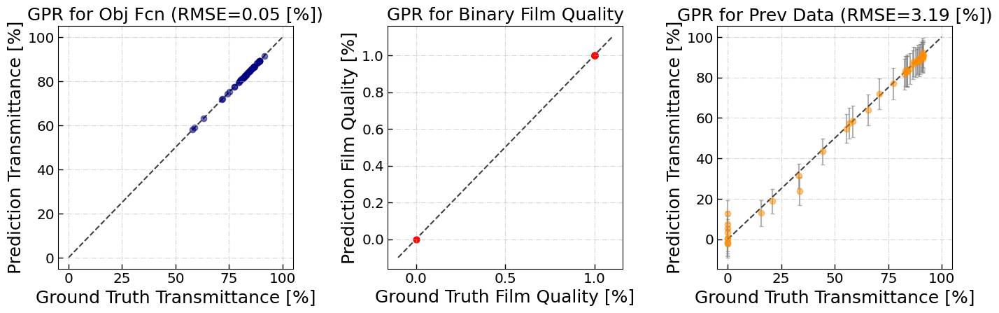

In [72]:
f_obj =  objective_model.model.predict
f_cons1 = constraint_model1.model.predict
f_cons2 = constraint_model2.model.predict

y_pred, y_uncer = f_obj(X)
y_pred = -y_pred[:,-1]
y_uncer = np.sqrt(y_uncer[:,-1])

yc_pred, yc_uncer = f_cons1(Xc)
yc_pred = -yc_pred[:,-1]+yc_offset
yc_uncer = np.sqrt(yc_uncer[:,-1])

yc2_pred, yc2_uncer = f_cons2(Xc2)
yc2_pred = -yc2_pred[:,-1]+yc2_offset
yc2_uncer = np.sqrt(yc2_uncer[:,-1])


from sklearn.metrics import mean_squared_error
fig, axes = plt.subplots(1, 3, figsize=(5.5*3, 4.5))
fs = 18
lims1 = (0, 100)
axes[0].scatter(Y[:,-1], y_pred, alpha = 0.5, c = 'navy' , edgecolor = 'navy')
axes[0].errorbar(Y[:,-1], y_pred, yerr = y_uncer, ms = 0, 
             ls = '', capsize = 2, alpha = 0.6,
             color = 'gray', zorder = 0)
axes[0].plot(lims1, lims1, 'k--', alpha=0.75, zorder=0)
rmse_value = np.sqrt(mean_squared_error(Y[:,-1], y_pred))
title = 'GPR for Obj Fcn' + " (RMSE=%.2f" % rmse_value+' [%])'
axes[0].set_xlabel('Ground Truth Transmittance [%]', fontsize = fs)
axes[0].set_ylabel('Prediction Transmittance [%]', fontsize = fs)
axes[0].set_title(title, fontsize = fs)

lims2 = (-.1, 1.1)
axes[1].scatter(Yc[:,-1], yc_pred, alpha = 0.6, edgecolor = 'r', c = 'r')
axes[1].errorbar(Yc[:,-1], yc_pred, yerr = yc_uncer, ms = 0, 
             ls = '', capsize = 2, alpha = 0.6,
             color = 'gray', zorder = 0)

axes[1].plot(lims2, lims2, 'k--', alpha=0.75, zorder=0)
title = 'GPR for Binary Film Quality'
axes[1].set_xlabel('Ground Truth Film Quality [%]', fontsize = fs)
axes[1].set_ylabel('Prediction Film Quality [%]', fontsize = fs)
axes[1].set_title(title, fontsize = fs)


lims3 = (0, 17)
axes[2].scatter(Yc2[:,-1], yc2_pred, alpha = 0.5, c = 'darkorange', edgecolor = 'darkorange')
axes[2].errorbar(Yc2[:,-1], yc2_pred, yerr = yc2_uncer, ms = 0, 
             ls = '', capsize = 2, alpha = 0.6,
             color = 'gray', zorder = 0)
axes[2].plot(lims1, lims1, 'k--', alpha=0.75, zorder=0)
rmse_value = np.sqrt(mean_squared_error(Yc2[:,-1], yc2_pred))
title = 'GPR for Prev Data' + " (RMSE=%.2f" % rmse_value+' [%])'

axes[2].set_xlabel('Ground Truth Transmittance [%]', fontsize = fs)
axes[2].set_ylabel('Prediction Transmittance [%]', fontsize = fs)
axes[2].set_title(title, fontsize = fs)

        
for i in range(len(axes)):
    axes[i].tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
    axes[i].grid(True, linestyle='-.')
plt.subplots_adjust(wspace = 0.4)

plt.show()

In [73]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from scipy.stats import spearmanr

mse = mean_squared_error
mse_all = mse(Y[:,-1], y_pred)
print ('all rmse: %.4f' % (np.sqrt(mse_all)))

rsquared_all = r2_score(Y[:,-1], y_pred)
print ('all R^2: %.4f' % (rsquared_all))

sprman_all = spearmanr(Y[:,-1], y_pred)
print ('all spearman: %.4f' % (sprman_all[0]))

all rmse: 0.0501
all R^2: 0.9999
all spearman: 0.9997


In [74]:
## Expeceted Improvement (EI)
#acquisition = ExpectedImprovement(objective_model, jitter=.1)
## Lower Confidence Bound (LCB)
#acquisition = NegativeLowerConfidenceBound(objective_model, beta = 1)
acquisition = MaxValueEntropySearch(objective_model, parameter_space, 50)
# fully integreated acquisition
# acquisition_generator = lambda m: ExpectedImprovement(m, jitter=.1)
# acquisition_generator = lambda m: NegativeLowerConfidenceBound(m, beta = 1)
# acquisition_integrated = IntegratedHyperParameterAcquisition(objective_model, acquisition_generator)
# acquisition = acquisition_integrated

# Make loop and collect points
bayesopt_cons_pr = ProbabilisticConstraintBayesianOptimizationLoop2(model_objective=objective_model, 
                                                          space=parameter_space, 
                                                          acquisition=acquisition,
                                                          model_constraint1=constraint_model1,
                                                          model_constraint2=constraint_model2,
                                                          batch_size = 14)#batchsize>10 to account for duplication

X_new = bayesopt_cons_pr.candidate_point_calculator.compute_next_points(bayesopt_cons_pr.loop_state)
X_new = x_normalizer(get_closest_array(x_denormalizer(X_new)))

f_obj =  objective_model.model.predict       
f_cons1 = constraint_model1.model.predict
f_cons2 = constraint_model2.model.predict

f_cons_acq = bayesopt_cons_pr.candidate_point_calculator.acquisition.acquisition.evaluate
f_raw_acq = bayesopt_cons_pr.candidate_point_calculator.acquisition.acquisition.acquisition_1.evaluate
f_cons_pr = bayesopt_cons_pr.candidate_point_calculator.acquisition.acquisition.acquisition_2.evaluate

print('total condition no.:', len(Xc))
print('total device no.:', len(bayesopt_cons_pr.loop_state.Y))
print('maximum Y (Transmittance [%]): ', -np.min(np.transpose(np.round(bayesopt_cons_pr.loop_state.Y, 2))))


df_Xnew = pd.DataFrame(get_closest_array(x_denormalizer(X_new)), columns = df_film.columns[1:10])
df_all = pd.concat([df_film.iloc[:,1:10], df_Xnew])#.sort_values(by=list(df_film.columns[1:10]))
df_all_ = df_all.drop_duplicates()
df_Xnew = df_all_.iloc[50:60]
df_Xnew = df_Xnew.sort_values(by=list(df_film.columns[1:10]), ignore_index = True)
df_Xnew.index = np.arange(len(df_Xnew))+len(df_film)
df_Xnew

total condition no.: 60
total device no.: 56
maximum Y (Transmittance [%]):  91.54


,E-81 amount [g],Vacuum distillation time [min],Curing agent amount [%],Thickness [um],Curing power1 [%],Curing power2 [%],Distance [cm],Time1 [s],Time2 [s]
60,10.0,120.0,3.5,200.0,25.0,90.0,18.0,2.0,9.0
61,10.0,120.0,3.5,250.0,30.0,85.0,18.0,2.0,9.0
62,10.0,180.0,3.0,250.0,30.0,80.0,18.0,2.0,8.0
63,10.0,180.0,3.0,250.0,30.0,85.0,18.0,2.0,8.0
64,10.0,180.0,3.0,300.0,30.0,80.0,18.0,2.0,8.0
65,10.0,240.0,3.0,450.0,25.0,85.0,18.0,2.0,7.0
66,10.0,240.0,3.0,500.0,20.0,80.0,18.0,2.0,7.0
67,10.0,240.0,3.0,500.0,25.0,80.0,12.0,2.0,7.0
68,10.0,240.0,3.0,500.0,25.0,80.0,18.0,2.0,7.0
69,14.0,120.0,3.5,300.0,15.0,90.0,18.0,2.0,9.0


In [75]:
X_new = x_normalizer(df_Xnew.values)

y_pred_new, y_uncer_new = f_obj(X_new)
y_pred_new = -y_pred_new
y_uncer_new = np.sqrt(y_uncer_new)

acq_produc = f_cons_acq(X_new)
acq_fcn = f_raw_acq(X_new)
acq_cons = f_cons_pr(X_new)

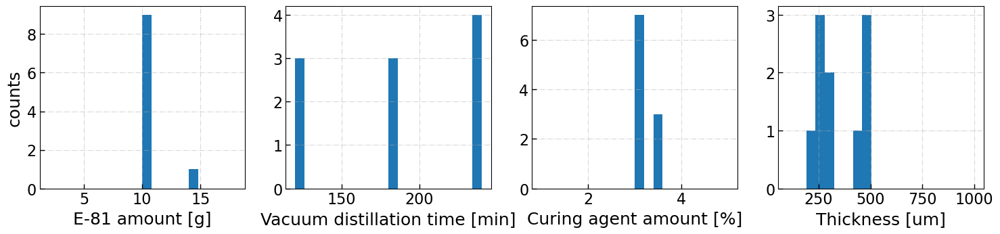

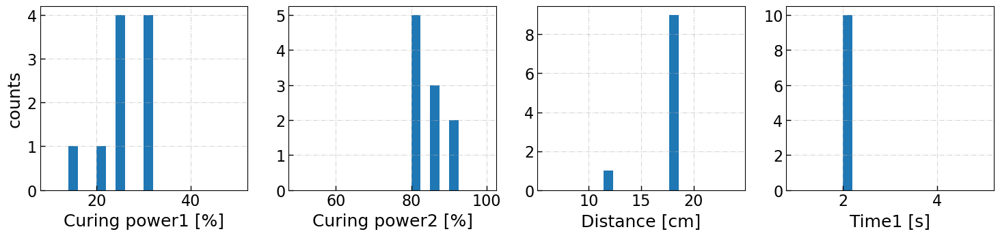

In [76]:
df = df_Xnew
df_cols = df.columns
n_col = 4 # num of columns per row in the figure

for n in np.arange(0, 8, n_col):
    fig,axes = plt.subplots(1, n_col, figsize=(18, 3.5), sharey = False)
    fs = 20
    for i in np.arange(n_col):
        if n< len(df_cols):
            axes[i].hist(df.iloc[:,n], bins= 20, range = (min(var_array[n]),max(var_array[n])))####
            axes[i].set_xlabel(df_cols[n], fontsize = 18)
            #axes[i].set_xlim(min(var_array[n])*0.8,max(var_array[n])*1.05)
        else:
            axes[i].axis("off")
        n = n+1      
    axes[0].set_ylabel('counts', fontsize = 18)
    for i in range(len(axes)):
        axes[i].tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
        axes[i].grid(True, linestyle='-.')
    plt.show()

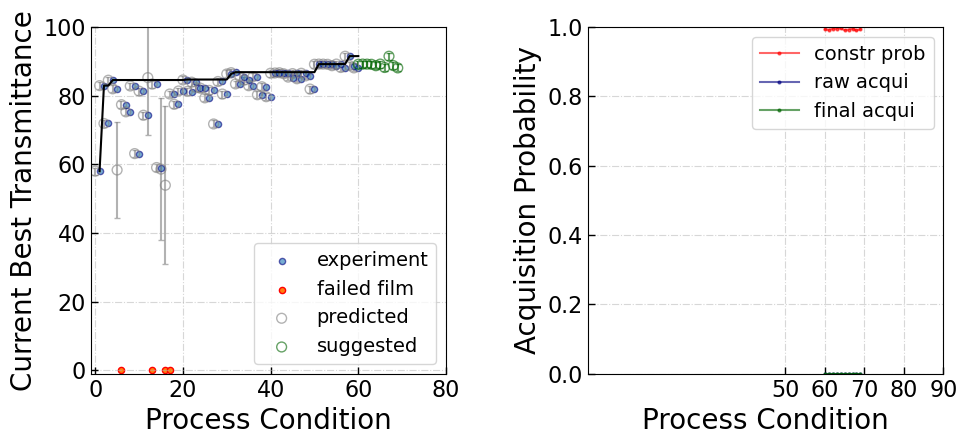

In [77]:
 f_obj =  objective_model.model.predict       

film_quality = df_film.sort_values('Experiment Condition').iloc[:,[0,-1]].values
device_tran = df_device.sort_values('Experiment Condition').iloc[:,[0,-1]].values

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5), sharey = False)
fs = 20
exp_cond = np.transpose(device_tran)[0]
exp_tran = np.transpose(device_tran)[1]

axes[0].scatter(exp_cond, exp_tran, #facecolor = 'none',
            edgecolor = 'navy', s = 20, alpha = 0.6, label = 'experiment')

unsuccess_film = np.transpose(film_quality[film_quality[:,-1] ==0])
axes[0].scatter(unsuccess_film[0], unsuccess_film[1],
                #facecolor = 'none',
                edgecolor = 'red',
                s = 20, label = 'failed film')
all_cond = np.concatenate([device_tran, np.transpose(unsuccess_film)])
all_cond = all_cond[np.argsort(all_cond[:,0])]
axes[0].plot(np.transpose(all_cond)[0], np.maximum.accumulate(np.transpose(all_cond)[1]), 
         marker = 'o', ms = 0, c = 'black')

X_sorted = x_normalizer(df_film.sort_values('Experiment Condition').iloc[:,1:10].values)
y_pred, y_uncer = f_obj(X_sorted)
y_pred = -y_pred[:,-1]
y_uncer = np.sqrt(y_uncer[:,-1])

axes[0].scatter(np.arange(len(X_sorted)), y_pred,
                s = 50, facecolors='none', alpha = 0.6, edgecolor = 'gray', label = 'predicted')
axes[0].errorbar(np.arange(len(X_sorted)), y_pred, yerr = y_uncer,  
                 ms = 0, ls = '', capsize = 2, alpha = 0.6, 
                 color = 'gray', zorder = 0)


y_pred_new, y_uncer_new = f_obj(X_new)
y_pred_new = -y_pred_new[:,-1]
y_uncer_new = np.sqrt(y_uncer_new[:,-1])

axes[0].scatter(np.arange(len(X_new))+len(Xc), y_pred_new,
                s = 50, facecolors='none', alpha = 0.6, edgecolor = 'darkgreen', label = 'suggested')
axes[0].errorbar(np.arange(len(X_new))+len(Xc), y_pred_new, yerr = y_uncer_new,  
                 ms = 0, ls = '', capsize = 2, alpha = 0.6, 
                 color = 'darkgreen', zorder = 0)


axes[0].set_ylabel('Current Best Transmittance', fontsize = 20)
axes[0].set_xlabel('Process Condition', fontsize = 20)

axes[0].set_ylim(-1, 100)
axes[0].set_xlim(-1, 80)
axes[0].set_xticks(np.arange(0,100,20))
axes[0].legend(fontsize = fs*0.7)

axes[1].plot(np.arange(len(X_new))+len(Xc), acq_cons, marker = 'o',
                ms = 2, alpha = 0.6, color = 'red', label = 'constr prob')
axes[1].plot(np.arange(len(X_new))+len(Xc), acq_fcn/90, marker = 'o',
                ms = 2, alpha = 0.6, color = 'navy', label = 'raw acqui')

axes[1].plot(np.arange(len(X_new))+len(Xc), acq_produc/90, marker = 'o',
                ms = 2, alpha = 0.6, color = 'darkgreen', label = 'final acqui')


axes[1].set_ylim(0, 1)
axes[1].set_xlim(0, 2)
axes[1].set_xticks(np.arange(50,100,10))
axes[1].set_ylabel('Acquisition Probability', fontsize = fs)
axes[1].set_xlabel('Process Condition', fontsize = fs)

for ax in axes:
    ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
    ax.grid(True, linestyle='-.')
plt.subplots_adjust(wspace = 0.4)
plt.legend(fontsize = fs*0.7)
plt.show()



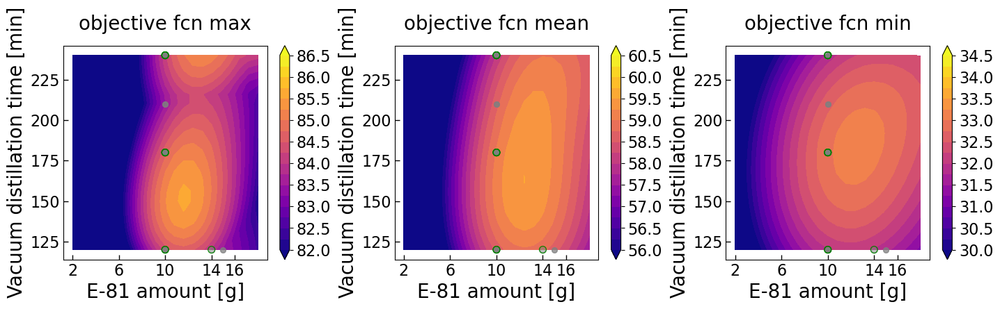

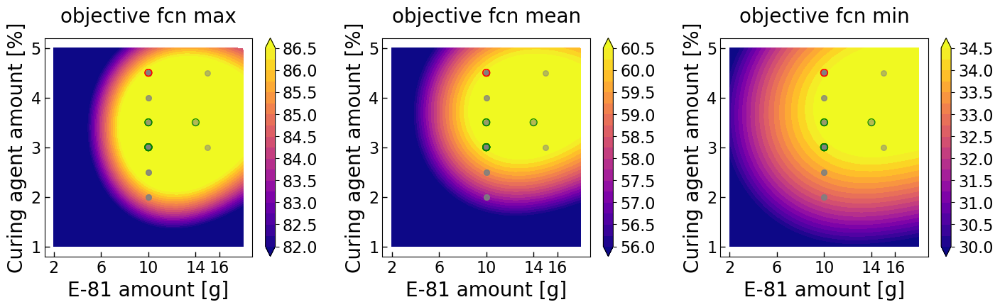

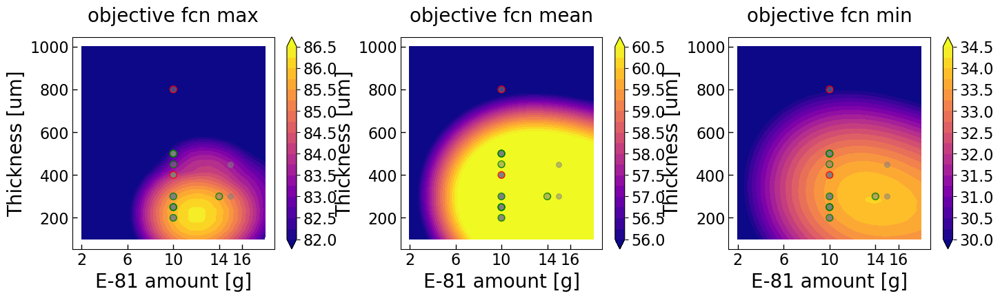

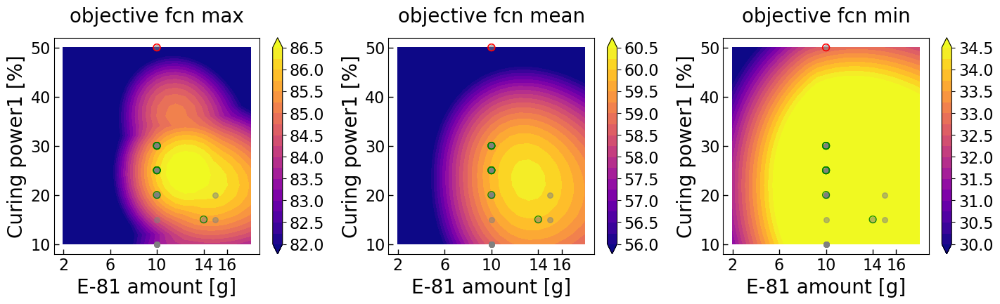

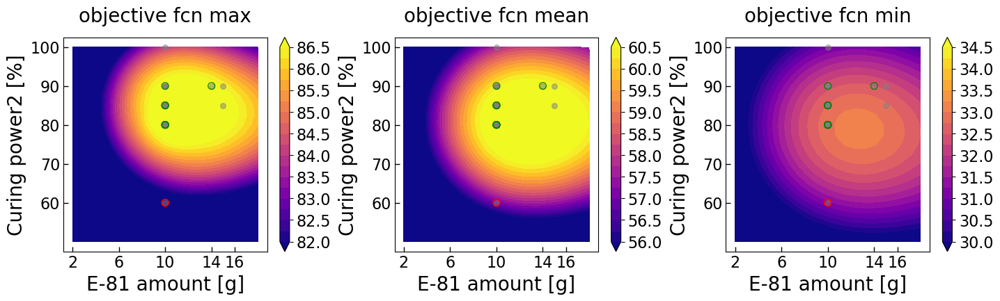

...

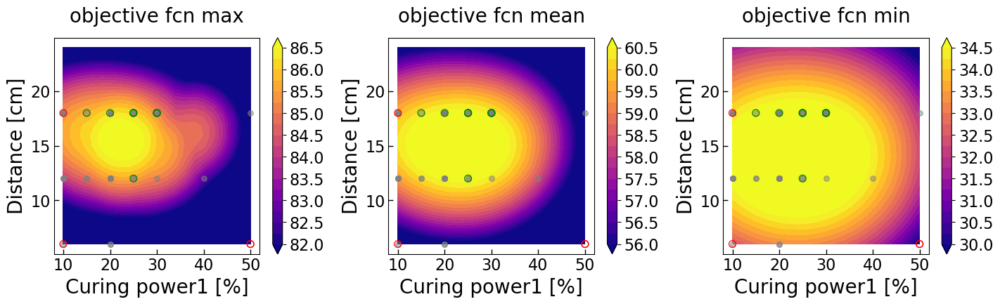

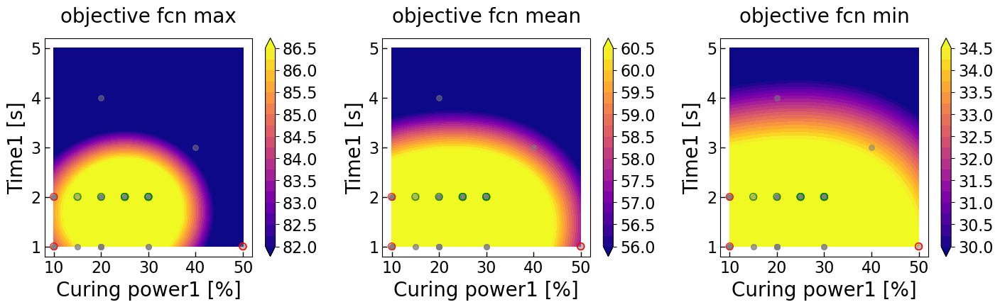

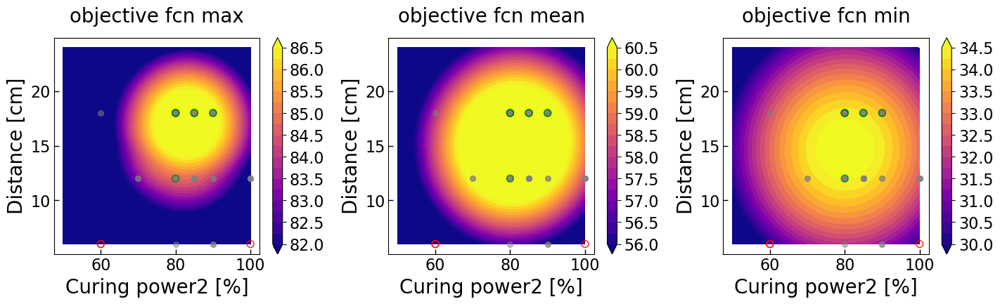

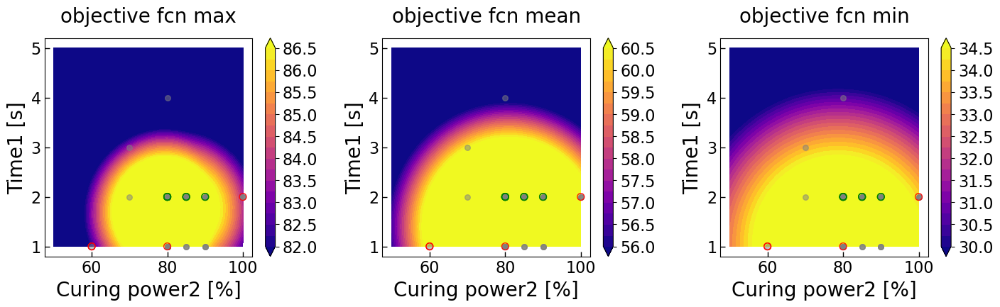

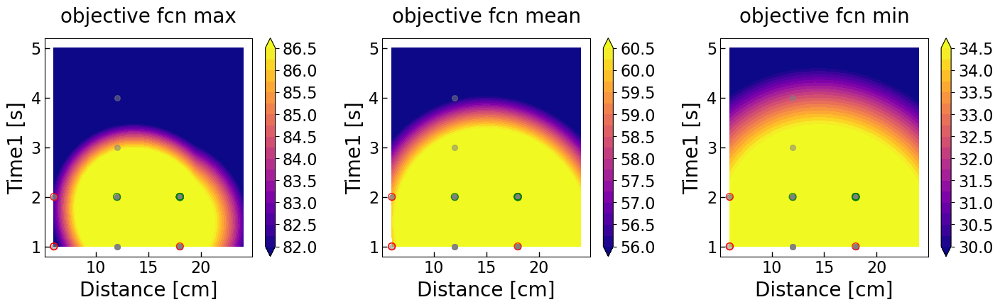

In [78]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_columns = df_device.iloc[:,1:9].columns
for i in range(input_dim):
    for j in range(input_dim-i-1):
        
## Generate a 2D grid for Contour plot
        ind1 = i
        ind2 = j+i+1
        if ind2 >= len(x_columns):
            continue  # 如果 ind2 超出范围，跳过本次循环
        n_steps =21
        x1x2y_pred, x1x2y_uncer =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_GQDs = np.copy(x_sampled)
                x_GQDs[:,ind1] = x1
                x_GQDs[:,ind2] = x2
                y_pred, y_uncer = f_obj(x_GQDs)
                y_pred = -y_pred
                x1_org = x_denormalizer(x_GQDs)[0,ind1]
                x2_org = x_denormalizer(x_GQDs)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(y_pred), np.mean(y_pred), np.min(y_pred)])
                x1x2y_uncer.append([x1_org, x2_org, np.max(np.sqrt(y_uncer)), np.mean(np.sqrt(y_uncer)), np.min(np.sqrt(y_uncer))])
        
        x1 = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2 = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
            
        y_pred_max = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_pred_mean = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_pred_min = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)
        
        y_uncer_max = np.array(x1x2y_uncer, dtype=object)[:,2].reshape(n_steps, n_steps)
        y_uncer_mean = np.array(x1x2y_uncer, dtype=object)[:,3].reshape(n_steps, n_steps)
        y_uncer_min = np.array(x1x2y_uncer, dtype=object)[:,4].reshape(n_steps, n_steps)

        fs = 20
        title_pad = 16
        
## Contour for Prediction Transmittance Mean
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
        colorbar_offset = [82, 56, 30]
        for ax, c_offset, y in zip(axes, colorbar_offset,
                                   [y_pred_max, y_pred_mean, y_pred_min]):
            
            c_plt1 = ax.contourf(x1, x2, y, levels = np.arange(19)*0.25+c_offset, cmap='plasma', extend = 'both')
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X)[:, ind1], 
                       x_denormalizer(X)[:, ind2], 
                       s = 30, facecolors='gray', alpha = 0.5, edgecolor = 'gray')
            ax.scatter(x_denormalizer(Xc[Yc[:,-1]==0])[:, ind1], ## show the conditions with poor film quality
                       x_denormalizer(Xc[Yc[:,-1]==0])[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')

            ax.scatter(x_denormalizer(X_new)[:, ind1], 
                       x_denormalizer(X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
            ax.set_xlabel(str(x_columns[ind1]),fontsize =  fs)
            ax.set_ylabel(str(x_columns[ind2]),fontsize =  fs)

            x1_delta = (np.max(x1)-np.min(x1))*0.05
            x2_delta = (np.max(x2)-np.min(x2))*0.05
            ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
            ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8)#, grid_alpha = 0.5
            if ind1==0:#GQDs-30 amount
                ax.set_xticks([2,6, 10, 14, 16])
            if ind1==1:#VVacuum distillation time
                ax.set_xticks([120, 150, 180, 210,240])
            if ind1==4:#Curing power1
                ax.set_xticks([10, 20, 30, 40, 50])
            if ind2==5:#Curing power2
                ax.set_yticks([60, 70, 80, 90, 100])
            #ax.grid(True, linestyle='-.')

        axes[0].set_title('objective fcn max', pad = title_pad,fontsize =  fs)
        axes[1].set_title('objective fcn mean', pad = title_pad,fontsize =  fs)
        axes[2].set_title('objective fcn min', pad = title_pad,fontsize =  fs)

        plt.subplots_adjust(wspace = 0.3)
        plt.show()
# # Contour for Uncertainty        
#         fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
#         colorbar_offset = [3, 2.5, 2]
#         for ax, c_offset, y in zip(axes, colorbar_offset,
#                                    [y_uncer_max, y_uncer_mean, y_uncer_min]):

#             c_plt1 = ax.contourf(x1, x2, y,  levels = np.arange(11)*0.2+c_offset, cmap='plasma', extend = 'both')
#             fig.colorbar(c_plt1, ax= ax)
#             ax.scatter(x_denormalizer(X)[:, ind1], 
#                        x_denormalizer(X)[:, ind2], 
#                        s = 50, facecolors='none', alpha = 0.9, edgecolor = 'gray')
#             ax.set_xlabel(str(x_columns[ind1]))
#             ax.set_ylabel(str(x_columns[ind2]))

#             x1_delta = (np.max(x1)-np.min(x1))*0.05
#             x2_delta = (np.max(x2)-np.min(x2))*0.05
#             ax.set_xlim(np.min(x1)-x1_delta, np.max(x1)+x1_delta)
#             ax.set_ylim(np.min(x2)-x2_delta, np.max(x2)+x2_delta)


#         axes[0].set_title('objective uncer max', pad = title_pad)
#         axes[1].set_title('objective uncer mean', pad = title_pad)
#         axes[2].set_title('objective uncer min', pad = title_pad)
#         plt.subplots_adjust(wspace = 0.25)
        plt.show()

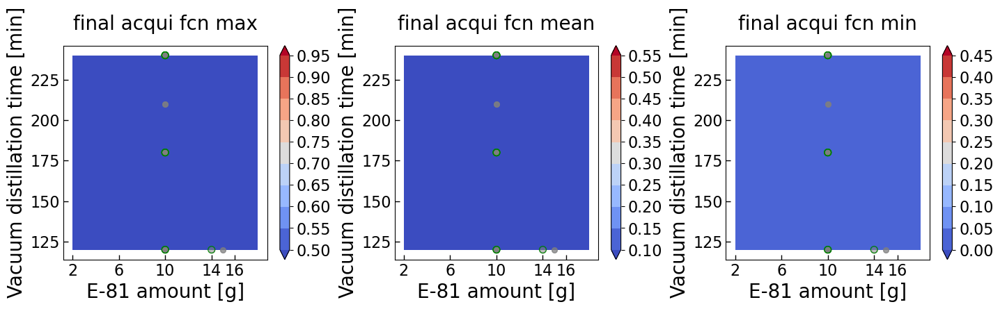

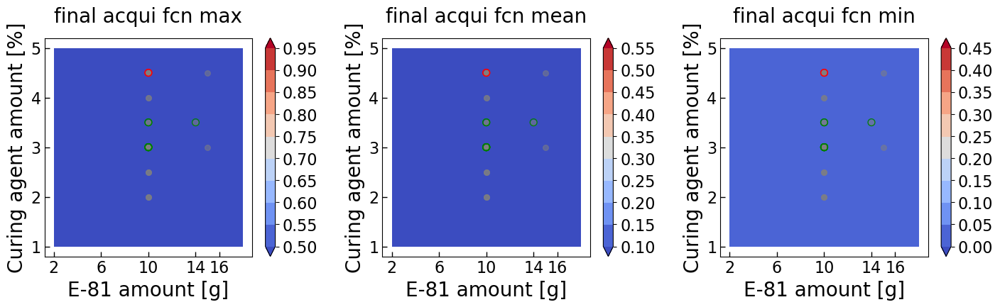

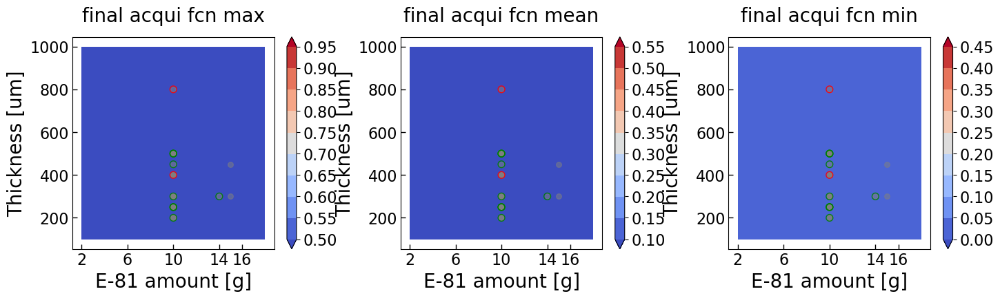

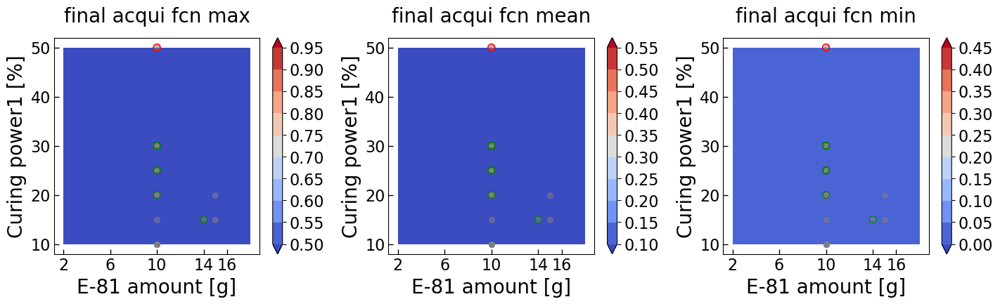

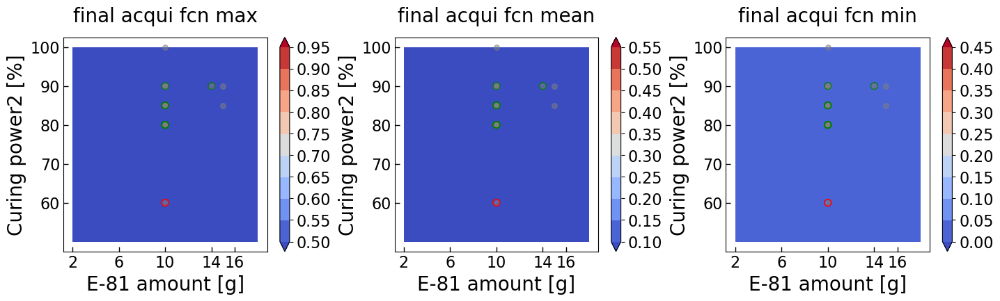

...

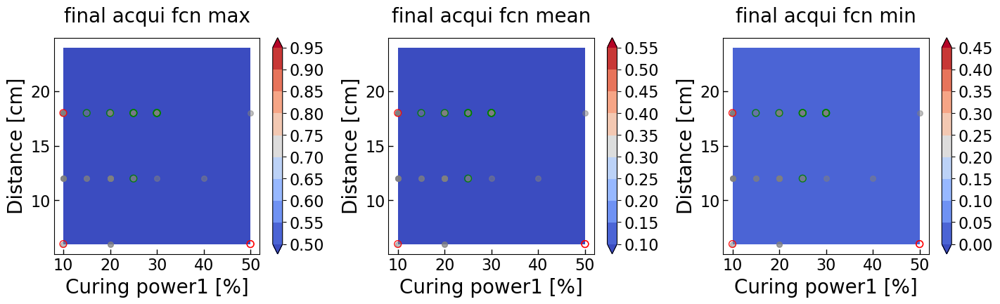

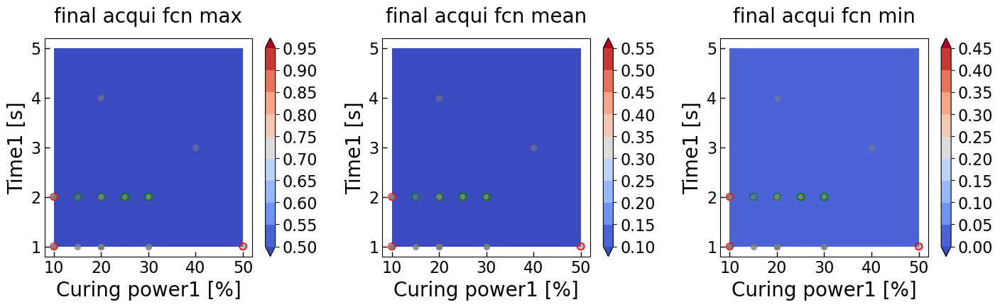

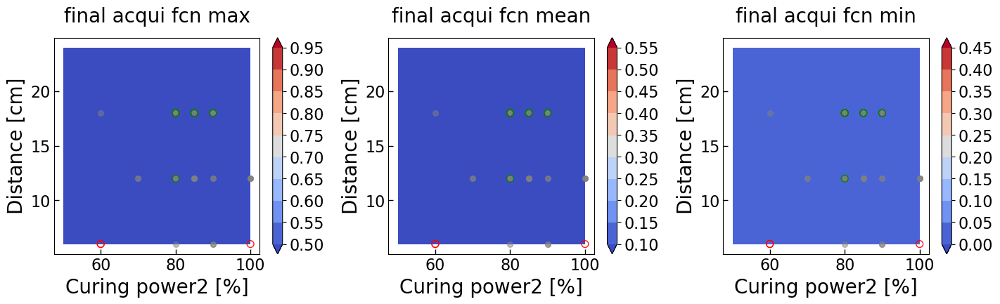

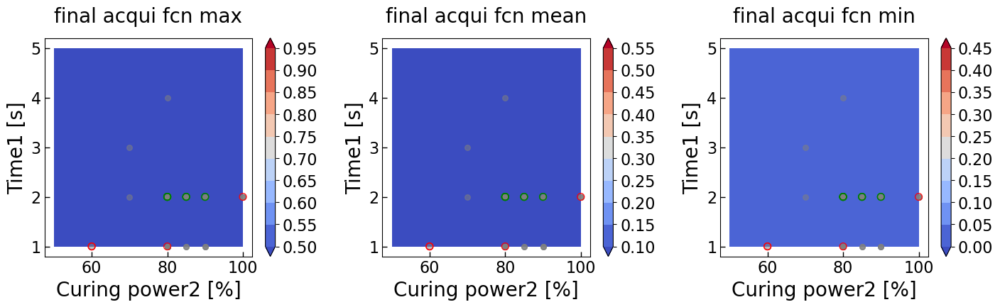

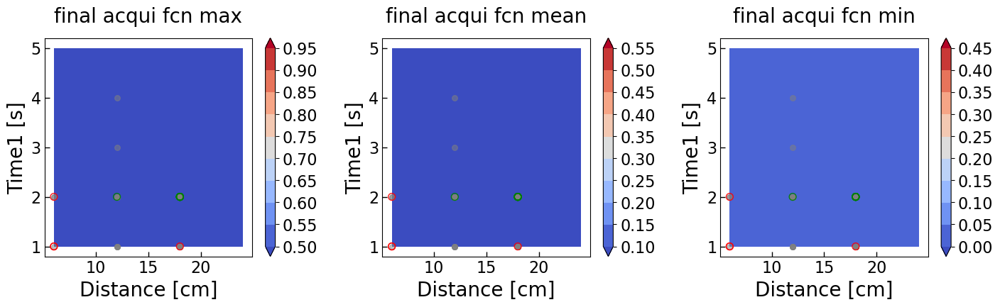

In [79]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_columns = df_film.iloc[:,1:9].columns
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        if ind2 >= len(x_columns):
            continue  # 如果 ind2 超出范围，跳过本次循环
        n_steps =21
        x1x2y_pred, x1x2y_var =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_GQDs = np.copy(x_sampled)
                x_GQDs[:,ind1] = x1
                x_GQDs[:,ind2] = x2
                yc_pr = f_cons_acq(x_GQDs)
                x1_org = x_denormalizer(x_GQDs)[0,ind1]
                x2_org = x_denormalizer(x_GQDs)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(yc_pr), np.mean(yc_pr), np.min(yc_pr)])
                
        x1c = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2c = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
        yc_pr_max = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        yc_pr_mean = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        yc_pr_min = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)

        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
        colorbar_offset = [0.5, 0.1, 0.0]
        for ax, y, c_offset in zip(axes, [yc_pr_max, yc_pr_mean, yc_pr_min],colorbar_offset):
            c_plt1 = ax.contourf(x1c, x2c, y/100, levels = np.arange(10)*0.05+c_offset, cmap='coolwarm', extend = 'both')# 
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(X)[:, ind1], 
                       x_denormalizer(X)[:, ind2], 
                       s = 30, facecolors='gray', alpha = 0.5, edgecolor = 'gray')
            ax.scatter(x_denormalizer(Xc[Yc[:,-1]==0])[:, ind1], 
                       x_denormalizer(Xc[Yc[:,-1]==0])[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter(x_denormalizer(X_new)[:, ind1], 
                       x_denormalizer(X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')
            ax.set_xlabel(str(x_columns[ind1]),fontsize = fs)
            ax.set_ylabel(str(x_columns[ind2]),fontsize = fs)

            x1_delta = (np.max(x1c)-np.min(x1c))*0.05
            x2_delta = (np.max(x2c)-np.min(x2c))*0.05
            ax.set_xlim(np.min(x1c)-x1_delta, np.max(x1c)+x1_delta)
            ax.set_ylim(np.min(x2c)-x2_delta, np.max(x2c)+x2_delta)
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
            if ind1==0:#GQDs-30 amount
                ax.set_xticks([2,6, 10, 14, 16])
            if ind1==1:#VVacuum distillation time
                ax.set_xticks([120, 150, 180, 210,240])
            if ind1==4:#Curing power1
                ax.set_xticks([10, 20, 30, 40, 50])
            if ind2==5:#Curing power2
                ax.set_yticks([60, 70, 80, 90, 100])
            #ax.grid(True, linestyle='-.')
            
            
        axes[0].set_title('final acqui fcn max', pad = title_pad,fontsize = fs)
        axes[1].set_title('final acqui fcn mean', pad = title_pad,fontsize = fs)
        axes[2].set_title('final acqui fcn min', pad = title_pad,fontsize = fs)
        plt.subplots_adjust(wspace = 0.3)
        plt.show()

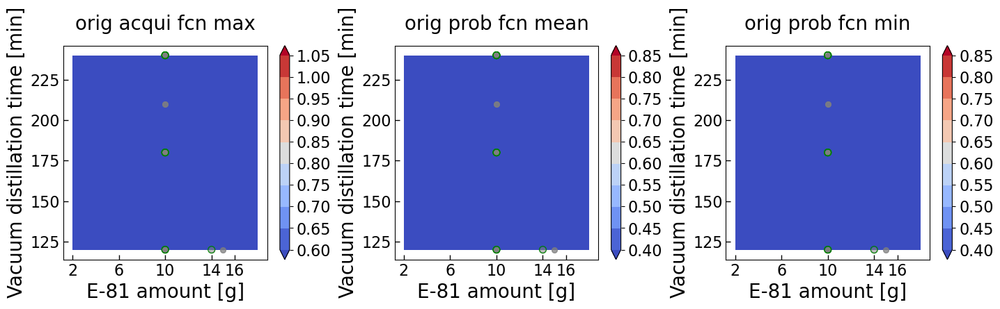

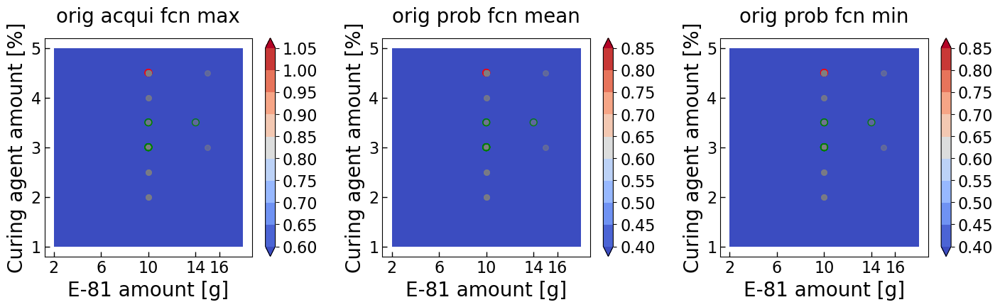

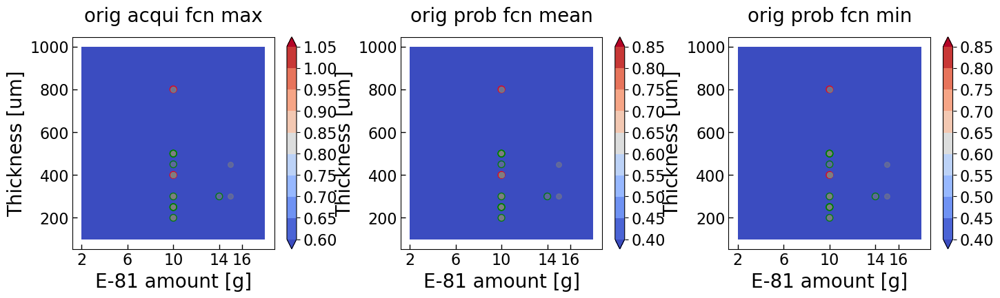

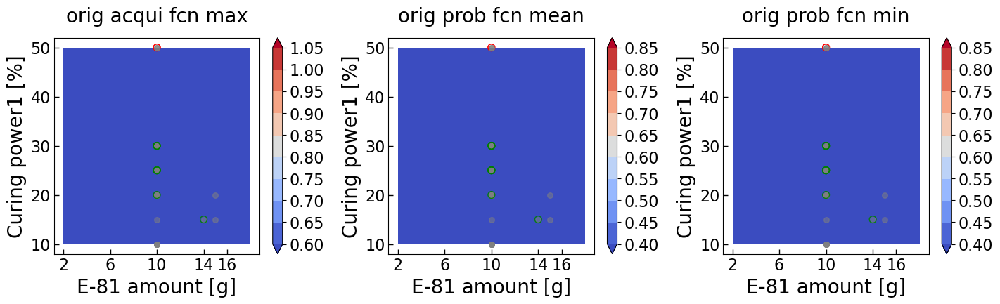

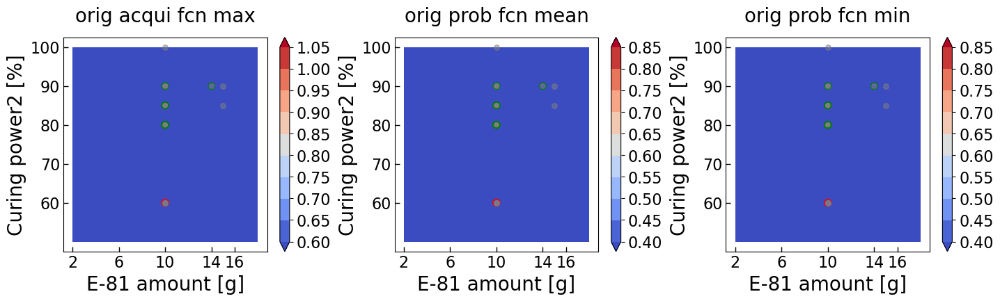

...

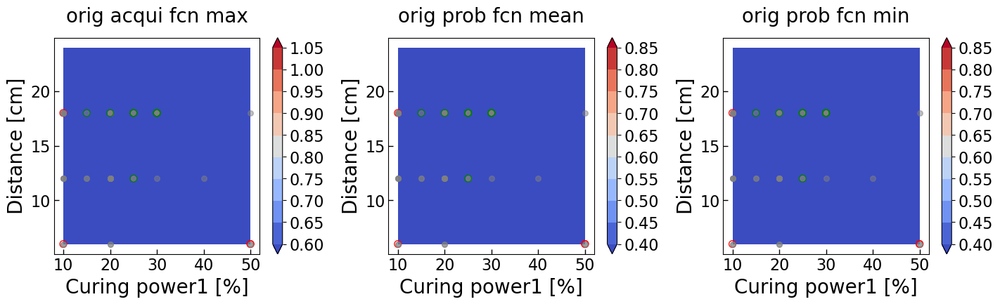

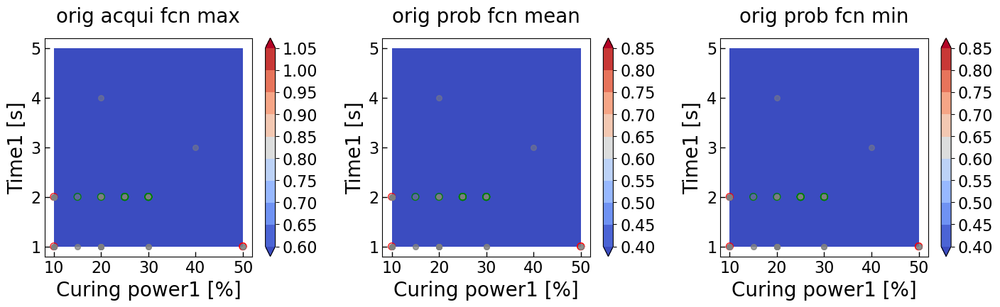

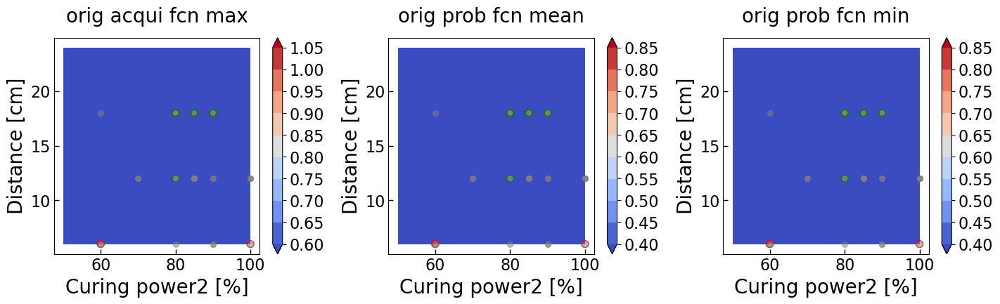

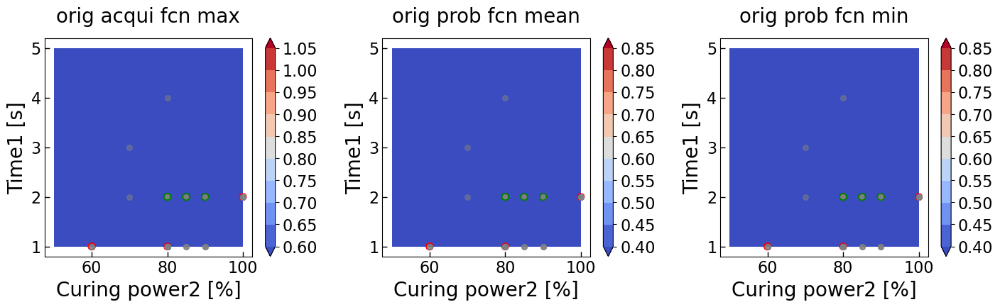

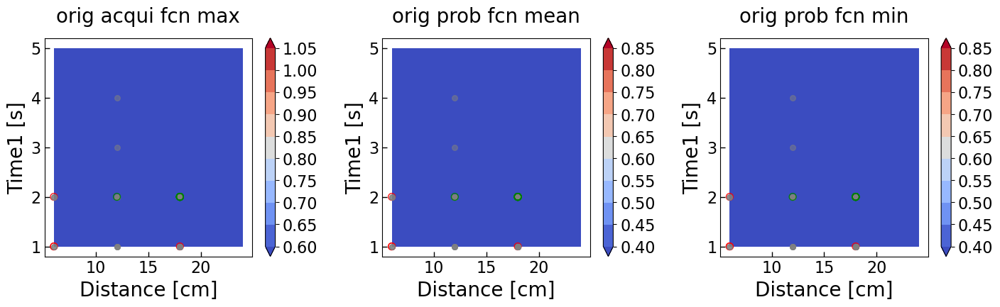

In [80]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_columns = df_film.iloc[:,1:9].columns
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        if ind2 >= len(x_columns):
            continue  # 如果 ind2 超出范围，跳过本次循环
        n_steps =21
        x1x2y_pred, x1x2y_var =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_GQDs = np.copy(x_sampled)
                x_GQDs[:,ind1] = x1
                x_GQDs[:,ind2] = x2
                yc_pr = f_raw_acq(x_GQDs)
                x1_org = x_denormalizer(x_GQDs)[0,ind1]
                x2_org = x_denormalizer(x_GQDs)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(yc_pr), np.mean(yc_pr), np.min(yc_pr)])
                
        x1c = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2c = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
        yc_pr_max = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        yc_pr_mean = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        yc_pr_min = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)

        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
        colorbar_offset = [0.6, 0.4, 0.4]
        for ax, y, c_offset in zip(axes, [yc_pr_max, yc_pr_mean, yc_pr_min],colorbar_offset):
            c_plt1 = ax.contourf(x1c, x2c, y/100,levels = np.arange(10)*0.05+c_offset, cmap='coolwarm', extend = 'both')# 
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(Xc[Yc[:,-1]==0])[:, ind1], 
                   x_denormalizer(Xc[Yc[:,-1]==0])[:, ind2], 
                   s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter(x_denormalizer(Xc)[:, ind1], 
                       x_denormalizer(Xc)[:, ind2], 
                       s = 30, facecolors='gray', alpha = 0.5, edgecolor = 'gray')
            ax.scatter(x_denormalizer(X_new)[:, ind1], 
                       x_denormalizer(X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')

            ax.set_xlabel(str(x_columns[ind1]), fontsize = fs)
            ax.set_ylabel(str(x_columns[ind2]), fontsize = fs)

            x1_delta = (np.max(x1c)-np.min(x1c))*0.05
            x2_delta = (np.max(x2c)-np.min(x2c))*0.05
            ax.set_xlim(np.min(x1c)-x1_delta, np.max(x1c)+x1_delta)
            ax.set_ylim(np.min(x2c)-x2_delta, np.max(x2c)+x2_delta)
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
            if ind1==0:#GQDs-30 amount
                ax.set_xticks([2,6, 10, 14, 16])
            if ind1==1:#VVacuum distillation time
                ax.set_xticks([120, 150, 180, 210,240])
            if ind1==4:#Curing power1
                ax.set_xticks([10, 20, 30, 40, 50])
            if ind2==5:#Curing power2
                ax.set_yticks([60, 70, 80, 90, 100])
            #axes[i].grid(True, linestyle='-.')

        axes[0].set_title('orig acqui fcn max', pad = title_pad, fontsize = fs)
        axes[1].set_title('orig prob fcn mean', pad = title_pad, fontsize = fs)
        axes[2].set_title('orig prob fcn min', pad = title_pad, fontsize = fs)
        plt.subplots_adjust(wspace = 0.3)
        plt.show()

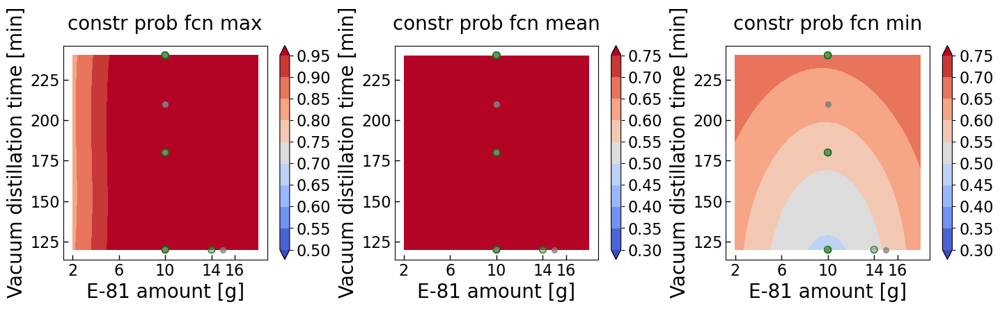

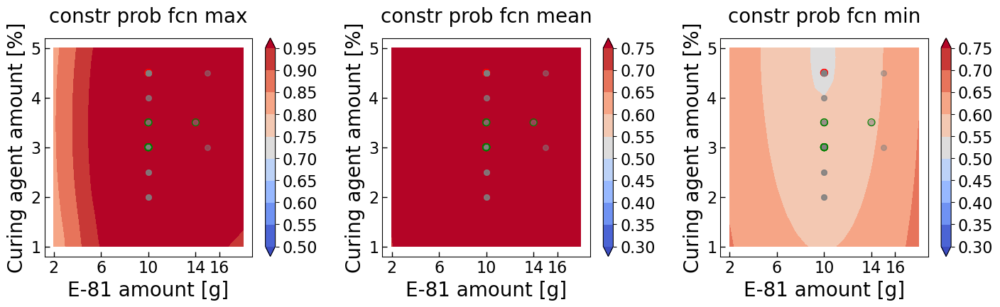

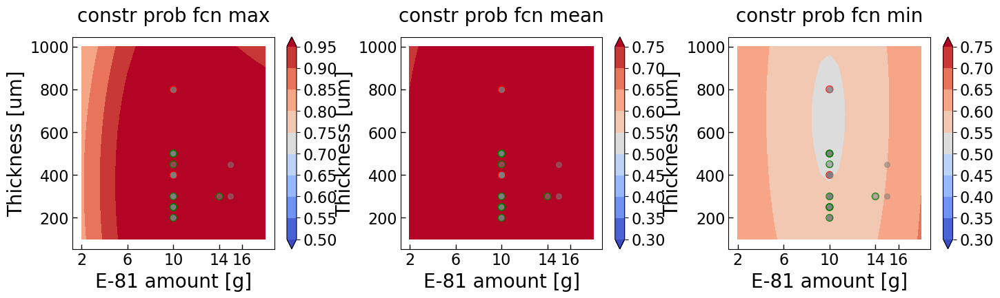

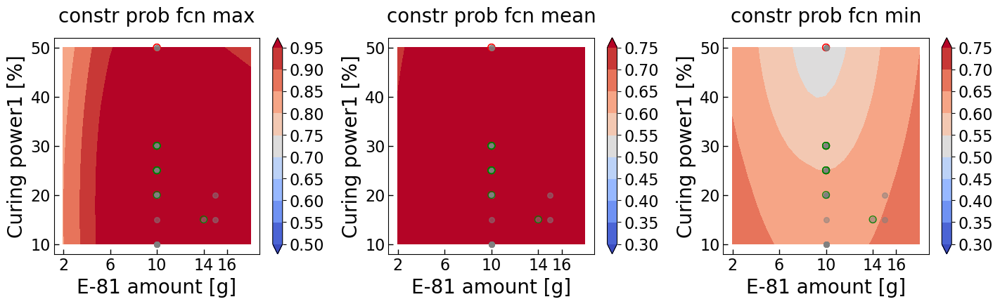

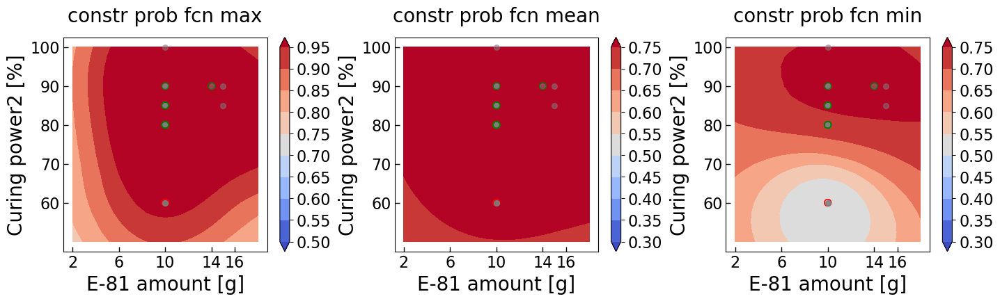

...

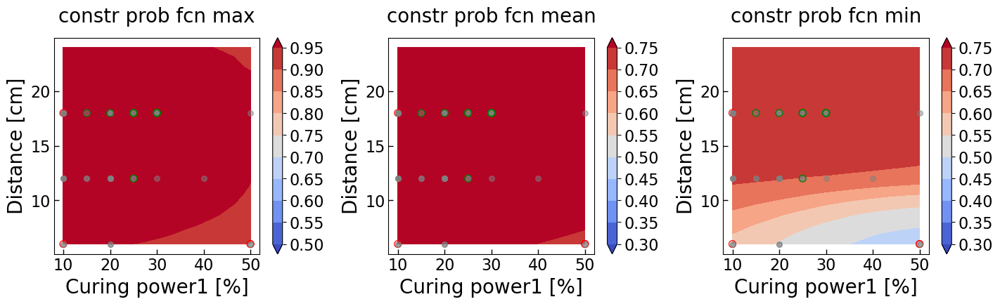

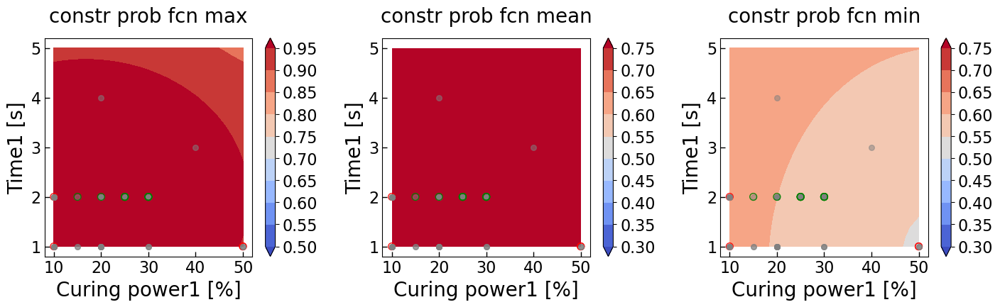

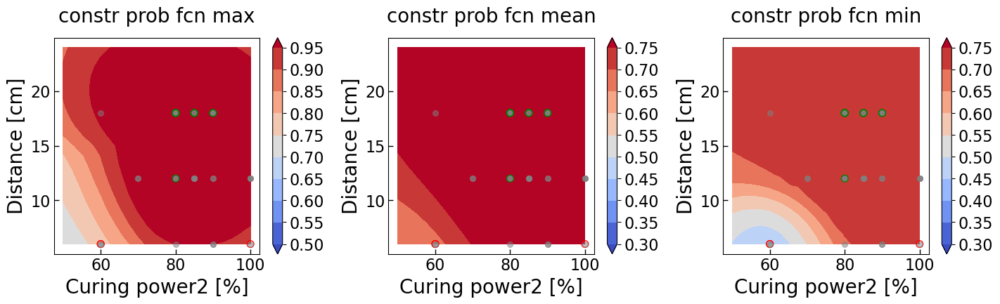

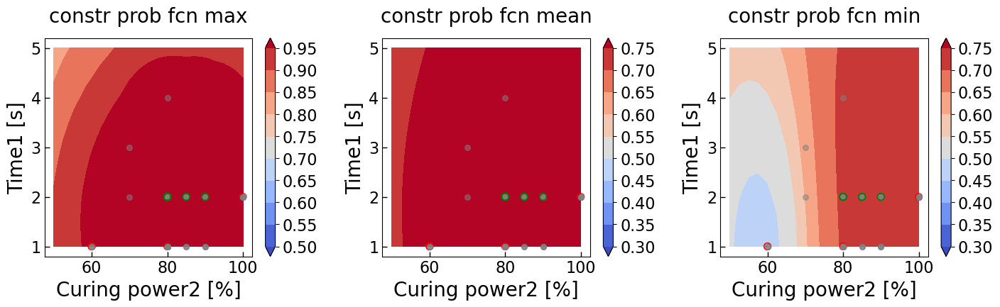

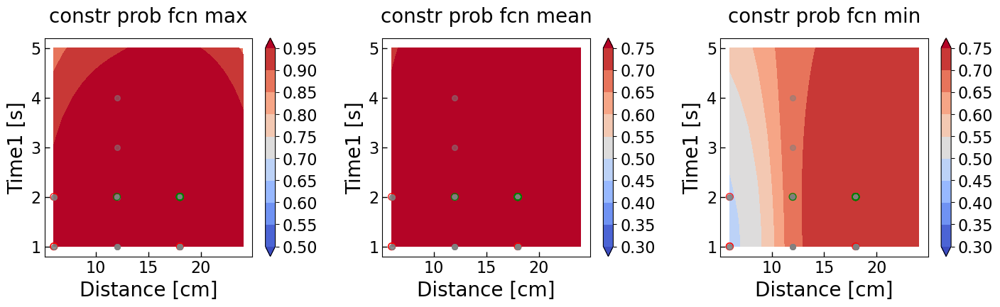

In [81]:
design = RandomDesign(parameter_space)
x_sampled = design.get_samples(200)
x_columns = df_film.iloc[:,1:-2].columns
for i in range(input_dim):
    for j in range(input_dim-i-1):
        ind1 = i
        ind2 = j+i+1
        if ind2 >= len(x_columns):
            continue  # 如果 ind2 超出范围，跳过本次循环
        n_steps =21
        x1x2y_pred, x1x2y_var =[[],[]]
        for x1 in np.linspace(0, 1, n_steps):
            for x2 in np.linspace(0, 1, n_steps):
                x_GQDs = np.copy(x_sampled)
                x_GQDs[:,ind1] = x1
                x_GQDs[:,ind2] = x2
                yc_pr = f_cons_pr(x_GQDs)
                x1_org = x_denormalizer(x_GQDs)[0,ind1]
                x2_org = x_denormalizer(x_GQDs)[0,ind2]
                x1x2y_pred.append([x1_org, x2_org, np.max(yc_pr), np.mean(yc_pr), np.min(yc_pr)])
                
        x1c = np.array(x1x2y_pred, dtype=object)[:,0].reshape(n_steps, n_steps)
        x2c = np.array(x1x2y_pred, dtype=object)[:,1].reshape(n_steps, n_steps)
        yc_pr_max = np.array(x1x2y_pred, dtype=object)[:,2].reshape(n_steps, n_steps)
        yc_pr_mean = np.array(x1x2y_pred, dtype=object)[:,3].reshape(n_steps, n_steps)
        yc_pr_min = np.array(x1x2y_pred, dtype=object)[:,4].reshape(n_steps, n_steps)

        fs = 20
        title_pad = 16
        
        fig,axes = plt.subplots(1, 3, figsize=(17, 4), sharey = False, sharex = False)
        colorbar_offset = [0.5, 0.3, 0.3]
        for ax, y, c_offset in zip(axes, [yc_pr_max, yc_pr_mean, yc_pr_min],colorbar_offset):
            c_plt1 = ax.contourf(x1c, x2c, y,levels = np.arange(10)*0.05+c_offset, cmap='coolwarm', extend = 'both')# 
            cbar = fig.colorbar(c_plt1, ax= ax)
            cbar.ax.tick_params(labelsize=fs*0.8)
            ax.scatter(x_denormalizer(Xc[Yc[:,-1]==0])[:, ind1], 
                   x_denormalizer(Xc[Yc[:,-1]==0])[:, ind2], 
                   s = 50, facecolors='none', alpha = 0.9, edgecolor = 'red')
            ax.scatter(x_denormalizer(Xc)[:, ind1], 
                       x_denormalizer(Xc)[:, ind2], 
                       s = 30, facecolors='gray', alpha = 0.5, edgecolor = 'gray')
            ax.scatter(x_denormalizer(X_new)[:, ind1], 
                       x_denormalizer(X_new)[:, ind2], 
                       s = 50, facecolors='none', alpha = 0.9, edgecolor = 'green')

            ax.set_xlabel(str(x_columns[ind1]), fontsize = fs)
            ax.set_ylabel(str(x_columns[ind2]), fontsize = fs)

            x1_delta = (np.max(x1c)-np.min(x1c))*0.05
            x2_delta = (np.max(x2c)-np.min(x2c))*0.05
            ax.set_xlim(np.min(x1c)-x1_delta, np.max(x1c)+x1_delta)
            ax.set_ylim(np.min(x2c)-x2_delta, np.max(x2c)+x2_delta)
            ax.tick_params(direction='in', length=5, width=1, labelsize = fs*.8, grid_alpha = 0.5)
            if ind1==0:#GQDs-30 amount
                ax.set_xticks([2,6, 10, 14, 16])
            if ind1==1:#VVacuum distillation time
                ax.set_xticks([120, 150, 180, 210,240])
            if ind1==4:#Curing power1
                ax.set_xticks([10, 20, 30, 40, 50])
            if ind2==5:#Curing power2
                ax.set_yticks([60, 70, 80, 90, 100])
            #axes[i].grid(True, linestyle='-.')

        axes[0].set_title('constr prob fcn max', pad = title_pad, fontsize = fs)
        axes[1].set_title('constr prob fcn mean', pad = title_pad, fontsize = fs)
        axes[2].set_title('constr prob fcn min', pad = title_pad, fontsize = fs)
        plt.subplots_adjust(wspace = 0.3)
        plt.show()